## 0. Install Necesaary Libary and Import Packages

In [2]:
import nltk
from nltk.corpus import brown
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from itertools import chain
from collections import Counter

In [3]:
# Download NLTK data
nltk.download('brown')
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package brown to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

## 1. Preprocessing and Selection

### 1(a). Preprocessing

In [4]:
corpus = brown.sents()
corpus

[['The', 'Fulton', 'County', 'Grand', 'Jury', 'said', 'Friday', 'an', 'investigation', 'of', "Atlanta's", 'recent', 'primary', 'election', 'produced', '``', 'no', 'evidence', "''", 'that', 'any', 'irregularities', 'took', 'place', '.'], ['The', 'jury', 'further', 'said', 'in', 'term-end', 'presentments', 'that', 'the', 'City', 'Executive', 'Committee', ',', 'which', 'had', 'over-all', 'charge', 'of', 'the', 'election', ',', '``', 'deserves', 'the', 'praise', 'and', 'thanks', 'of', 'the', 'City', 'of', 'Atlanta', "''", 'for', 'the', 'manner', 'in', 'which', 'the', 'election', 'was', 'conducted', '.'], ...]

In [5]:
def count_sentences_words(text):
    # Count number of sentences
    num_sentences = len(text)
    print("Number of sentences: ", num_sentences)
    # Count number of words
    num_words = sum(len(sentence) for sentence in text)
    print("Number of words: ", num_words)

In [6]:
count_sentences_words(corpus)

Number of sentences:  57340
Number of words:  1161192


In [8]:
%%time
def preprocess_corpus(corpus):
    stop_words = set(stopwords.words('english'))
    preprocessed_corpus = []
    for sentence in corpus:
        preprocessed_sentence = []
        for token in sentence:
            token = token.lower()
            if token not in stop_words:
                if token.isalpha():
                    preprocessed_sentence.append(token)
        preprocessed_corpus.append(preprocessed_sentence)
    
    # Remove rare words
    word_freq = Counter(chain(*preprocessed_corpus))
    rare_words = set(word for word in word_freq.elements() if word_freq[word] < 5)
    preprocessed_corpus = [[word for word in sentence if word not in rare_words] for sentence in preprocessed_corpus]
    
    return preprocessed_corpus

preprocessed_brown_corpus = preprocess_corpus(brown.sents())
print("Preprocessed Brown Corpus:\n", preprocessed_brown_corpus[:10])

Preprocessed Brown Corpus:
 [['fulton', 'county', 'grand', 'jury', 'said', 'friday', 'investigation', 'recent', 'primary', 'election', 'produced', 'evidence', 'irregularities', 'took', 'place'], ['jury', 'said', 'city', 'executive', 'committee', 'charge', 'election', 'deserves', 'praise', 'thanks', 'city', 'atlanta', 'manner', 'election', 'conducted'], ['term', 'jury', 'charged', 'fulton', 'superior', 'court', 'judge', 'investigate', 'reports', 'possible', 'irregularities', 'primary', 'allen'], ['relative', 'handful', 'reports', 'received', 'jury', 'said', 'considering', 'widespread', 'interest', 'election', 'number', 'voters', 'size', 'city'], ['jury', 'said', 'find', 'many', 'registration', 'election', 'laws', 'inadequate', 'often', 'ambiguous'], ['recommended', 'fulton', 'legislators', 'act', 'laws', 'studied', 'revised', 'end', 'improving'], ['grand', 'jury', 'commented', 'number', 'topics', 'among', 'atlanta', 'fulton', 'county', 'purchasing', 'departments', 'said', 'well', 'opera

In [9]:
count_sentences_words(preprocessed_brown_corpus)

Number of sentences:  57340
Number of words:  463133


### 1.(b) Selection

In [10]:
sentences = preprocessed_brown_corpus[:57340]

In [11]:
count_sentences_words(sentences)

Number of sentences:  57340
Number of words:  463133


## 2. Implementation of Co-Occurence Matrix and SVD

### 2(a). Implementation of Co-Occurence Matrix

In [12]:
import numpy as np
import pandas as pd
from collections import defaultdict
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import svds
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import svds

In [13]:
%%time
window_size = 2
# Create vocabulary of words in the corpus
vocab = set(sum(sentences, []))

# Create a mapping from word to index in the vocabulary
word2idx = {word: idx for idx, word in enumerate(sorted(vocab))}

# Create co-occurrence matrix
vocab_size = len(vocab)
cooccurrence_matrix = np.zeros((vocab_size, vocab_size))
for sentence in sentences:
    for i in range(len(sentence)):
        for j in range(max(0, i - window_size), min(len(sentence), i + window_size + 1)):
            if i != j:
                cooccurrence_matrix[word2idx[sentence[i]]][word2idx[sentence[j]]] += 1

# Convert co-occurrence matrix to sparse matrix for efficiency
from scipy.sparse import csr_matrix
rows, cols, data = [], [], []
for i in range(vocab_size):
    for j in range(vocab_size):
        if cooccurrence_matrix[i][j] > 0:
            rows.append(i)
            cols.append(j)
            data.append(cooccurrence_matrix[i][j])
cooccurrence_matrix_sparse = csr_matrix((data, (rows, cols)))

# Create a dataframe to display the co-occurrence matrix
df = pd.DataFrame(cooccurrence_matrix, index=sorted(vocab), columns=sorted(vocab))
df1 = df.iloc[:5, 3000:3060]
df1

Wall time: 5min 13s


,dark,darkened,darkness,darling,darted,dartmouth,dash,dashed,data,date,...,debutante,decade,decades,decay,deceased,deceived,december,decency,decent,decide
aaron,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
abandon,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
abandoned,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
abandoning,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
abandonment,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [20]:
distinct_values = set(pd.Series(df.values.flatten()).unique())
num_distinct = len(distinct_values)
print("Number of distinct values in Matrix: ", num_distinct)
print("Distinct values in Matrix are: ", distinct_values)

Number of distinct values in Matrix:  80
Distinct values in Matrix are:  {0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 59.0, 61.0, 63.0, 64.0, 65.0, 69.0, 70.0, 73.0, 74.0, 78.0, 79.0, 80.0, 81.0, 82.0, 84.0, 86.0, 91.0, 109.0, 114.0, 138.0, 153.0, 300.0, 398.0, 438.0}


In [21]:
value_counts = df.stack().value_counts()
value_counts_set = set(value_counts.items())
print("Count of each distinct Value in Matrix :\n", value_counts_set)

Count of each distinct Value in Matrix :
 {(28.0, 30), (32.0, 21), (86.0, 1), (12.0, 418), (55.0, 4), (59.0, 2), (52.0, 8), (41.0, 8), (57.0, 4), (21.0, 48), (35.0, 10), (10.0, 621), (18.0, 122), (11.0, 446), (153.0, 2), (24.0, 28), (70.0, 4), (91.0, 2), (300.0, 2), (46.0, 6), (4.0, 11627), (53.0, 2), (64.0, 2), (39.0, 12), (47.0, 4), (2.0, 108195), (25.0, 38), (15.0, 176), (49.0, 4), (398.0, 2), (81.0, 2), (54.0, 3), (138.0, 2), (23.0, 24), (44.0, 1), (16.0, 140), (56.0, 2), (34.0, 11), (74.0, 1), (43.0, 4), (14.0, 215), (13.0, 302), (27.0, 26), (48.0, 3), (73.0, 2), (1.0, 1037710), (45.0, 4), (20.0, 87), (6.0, 3279), (79.0, 2), (40.0, 10), (37.0, 2), (31.0, 16), (438.0, 1), (36.0, 15), (19.0, 90), (109.0, 2), (80.0, 2), (69.0, 2), (30.0, 19), (33.0, 18), (29.0, 14), (8.0, 1251), (17.0, 134), (82.0, 4), (114.0, 2), (5.0, 5510), (3.0, 28736), (61.0, 2), (63.0, 2), (78.0, 2), (9.0, 888), (26.0, 28), (0.0, 173883409), (50.0, 4), (65.0, 4), (22.0, 42), (84.0, 2), (38.0, 14), (7.0, 1930)}


### 2(b). Implementation of SVD

In [22]:
%%time
from collections import Counter

# Count the words and construct a vocabulary
word_counts = Counter(word for sentence in sentences for word in sentence)
vocabulary = list(word_counts.keys())
vocabulary.sort()

# Construct word-ID mapping
word2id = {word: i for i, word in enumerate(vocabulary)}
id2word = {i: word for i, word in enumerate(vocabulary)}

# Compute co-occurrence matrix
window_size = 2
data, rows, cols = [], [], []
for sentence in sentences:
    for i, word1 in enumerate(sentence):
        for j, word2 in enumerate(sentence):
            if i != j and abs(i - j) <= window_size:
                rows.append(word2id[word1])
                cols.append(word2id[word2])
                data.append(1)
cooccurrence_matrix = csr_matrix((data, (rows, cols)))

# Convert co-occurrence matrix to DataFrame
df = pd.DataFrame(cooccurrence_matrix.toarray(), index=vocabulary, columns=vocabulary)

# Perform SVD on co-occurrence matrix to get word embeddings
embedding_size = 30
U, S, Vt = np.linalg.svd(cooccurrence_matrix.toarray(), full_matrices=False)
word_embeddings = U @ np.diag(np.sqrt(S))[:, :embedding_size]

# Print word embeddings
for i, word in enumerate(vocabulary):
    print(f"{word}: {word_embeddings[i]}")

aaron: [-0.01382827  0.00246607 -0.00339908 -0.00021909  0.00346361  0.00026282
  0.00523575 -0.00116297  0.00053282  0.00095994 -0.00532702 -0.01442333
 -0.04173329 -0.01038765 -0.0370309  -0.03131792 -0.00322122 -0.01588261
  0.00728825  0.00521705 -0.00839848 -0.00676272  0.02868584 -0.00139329
  0.00361798  0.00167555  0.0085362   0.00897281  0.01144857  0.00521924]
abandon: [-0.04652067  0.00251955  0.00037228  0.00109745  0.00797565  0.00860088
 -0.03148249  0.02142714 -0.02363121  0.04836864 -0.03252858  0.02640619
 -0.0101788   0.03832587 -0.00405806 -0.01888356  0.01959153 -0.00707754
 -0.02563466  0.01464675 -0.01287851 -0.08280092 -0.07422675  0.05983133
 -0.01733162 -0.01744846 -0.03253574  0.00828449 -0.03735384 -0.01526718]
abandoned: [-0.06245438  0.00301415 -0.00410248  0.00179155 -0.02641345 -0.0327429
 -0.00472535  0.01488684 -0.01347248  0.03298612  0.00437205 -0.02865652
  0.03881511  0.01765207  0.01930007 -0.01240438  0.03591324  0.03439472
 -0.01332334  0.0093591

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



sensational: [-0.02980356  0.00262498 -0.00474887  0.00012395  0.00488894  0.00398414
  0.00403208  0.01070514  0.00286383 -0.01269606 -0.0072962  -0.02515539
  0.01399364  0.06157615 -0.012272    0.01023779 -0.01023191  0.0095045
  0.03503308  0.00049407  0.01037038 -0.014998   -0.00563772  0.00657546
  0.02485919  0.00825682 -0.00983428  0.00261637 -0.01364031 -0.03069712]
sensations: [-3.25076729e-02 -1.13304960e-03 -5.48718266e-03 -2.73084836e-05
  4.23242043e-03  3.95775219e-03  1.20207359e-02  1.17553800e-02
  7.57924242e-04 -3.17433598e-02  3.39480374e-02 -2.03599676e-02
  3.23132197e-02  2.53482205e-02  1.61197432e-02  6.41088547e-03
  2.71906315e-02 -2.62041495e-02 -7.83933576e-03 -1.99923562e-03
  4.34173945e-03  3.25178372e-02 -1.37917863e-02 -9.76127640e-03
  2.10481172e-02  5.00997947e-03  2.10088227e-04 -1.31643001e-03
  2.58463145e-02  2.28713963e-02]
sense: [-0.77306183  0.06249591 -0.090572    0.00600649  0.05994137 -0.04532534
 -0.24096857  0.53056543 -0.27304654 -0.0

## 3. Investigation

### 3. Investigation Part-(a)

In [23]:
from sklearn.metrics.pairwise import cosine_similarity
# Compute cosine similarity matrix
cosine_sim_matrix = cosine_similarity(word_embeddings)
# Define a function to get top N most similar words to a given word
def get_top_similar_words(word, cosine_sim_matrix, vocabulary, n=10):
    word_id = vocabulary.index(word)
    sim_scores = list(enumerate(cosine_sim_matrix[word_id]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:n+1]
    similar_words = [vocabulary[i] for i, _ in sim_scores]
    return similar_words

# Test the function
word = 'jury'
similar_words = get_top_similar_words(word, cosine_sim_matrix, vocabulary)
print(f"The top {len(similar_words)} most similar words to '{word}' are:")
for i, similar_word in enumerate(similar_words):
    print(f"{i+1}. {similar_word}")


The top 10 most similar words to 'jury' are:
1. leavitt
2. karns
3. charlotte
4. patiently
5. macneff
6. sandman
7. hemphill
8. clifford
9. glared
10. sweetly


In [24]:
# Find similarity between two words
word1 = 'fulton'
word2 = 'county'
word1_index = word2id[word1]
word2_index = word2id[word2]
similarity = cosine_similarity(word_embeddings[word1_index].reshape(1,-1), word_embeddings[word2_index].reshape(1,-1))
print(f"Similarity between {word1} and {word2}: {similarity[0][0]}")

Similarity between fulton and county: 0.6022844163706125


### 3. Investigation Part-(b)

In [25]:
%%time
from collections import Counter
from scipy.sparse import csr_matrix
import numpy as np
import pandas as pd

# Count the words and construct a vocabulary
word_counts = Counter(word for sentence in sentences for word in sentence)
vocabulary = list(word_counts.keys())
vocabulary.sort()

# Construct word-ID mapping
word2id = {word: i for i, word in enumerate(vocabulary)}
id2word = {i: word for i, word in enumerate(vocabulary)}

# Compute co-occurrence matrix
window_size = 2
data, rows, cols = [], [], []
for sentence in sentences:
    for i, word1 in enumerate(sentence):
        for j, word2 in enumerate(sentence):
            if i != j and abs(i - j) <= window_size:
                rows.append(word2id[word1])
                cols.append(word2id[word2])
                data.append(1)
cooccurrence_matrix = csr_matrix((data, (rows, cols)))

# Convert co-occurrence matrix to DataFrame
df = pd.DataFrame(cooccurrence_matrix.toarray(), index=vocabulary, columns=vocabulary)

# Perform SVD on co-occurrence matrix to get word embeddings
embedding_size = 20
U, S, Vt = np.linalg.svd(cooccurrence_matrix.toarray(), full_matrices=False)
word_embeddings = U @ np.diag(np.sqrt(S))[:, :embedding_size]

# Print word embeddings
for i, word in enumerate(vocabulary):
    print(f"{word}: {word_embeddings[i]}")


aaron: [-0.01382827  0.00246607 -0.00339908 -0.00021909  0.00346361  0.00026282
  0.00523575 -0.00116297  0.00053282  0.00095994 -0.00532702 -0.01442333
 -0.04173329 -0.01038765 -0.0370309  -0.03131792 -0.00322122 -0.01588261
  0.00728825  0.00521705]
abandon: [-0.04652067  0.00251955  0.00037228  0.00109745  0.00797565  0.00860088
 -0.03148249  0.02142714 -0.02363121  0.04836864 -0.03252858  0.02640619
 -0.0101788   0.03832587 -0.00405806 -0.01888356  0.01959153 -0.00707754
 -0.02563466  0.01464675]
abandoned: [-0.06245438  0.00301415 -0.00410248  0.00179155 -0.02641345 -0.0327429
 -0.00472535  0.01488684 -0.01347248  0.03298612  0.00437205 -0.02865652
  0.03881511  0.01765207  0.01930007 -0.01240438  0.03591324  0.03439472
 -0.01332334  0.00935918]
abandoning: [-1.93641008e-02  3.11346499e-03 -2.56859713e-03  1.38603475e-04
  4.66087376e-03  3.84755789e-05 -4.97532349e-03  9.91202544e-03
 -2.14882693e-03 -9.21779936e-03  4.10311509e-03  3.71789715e-03
 -2.14384471e-02 -1.30274216e-04

In [17]:
%%time
from collections import Counter
from scipy.sparse import csr_matrix
import numpy as np
import pandas as pd

# Count the words and construct a vocabulary
word_counts = Counter(word for sentence in sentences for word in sentence)
vocabulary = list(word_counts.keys())
vocabulary.sort()

# Construct word-ID mapping
word2id = {word: i for i, word in enumerate(vocabulary)}
id2word = {i: word for i, word in enumerate(vocabulary)}

# Compute co-occurrence matrix
window_size = 2
data, rows, cols = [], [], []
for sentence in sentences:
    for i, word1 in enumerate(sentence):
        for j, word2 in enumerate(sentence):
            if i != j and abs(i - j) <= window_size:
                rows.append(word2id[word1])
                cols.append(word2id[word2])
                data.append(1)
cooccurrence_matrix = csr_matrix((data, (rows, cols)))

# Convert co-occurrence matrix to DataFrame
df = pd.DataFrame(cooccurrence_matrix.toarray(), index=vocabulary, columns=vocabulary)

# Perform SVD on co-occurrence matrix to get word embeddings
embedding_size = 15
U, S, Vt = np.linalg.svd(cooccurrence_matrix.toarray(), full_matrices=False)
word_embeddings = U @ np.diag(np.sqrt(S))[:, :embedding_size]

# Print word embeddings
for i, word in enumerate(vocabulary):
    print(f"{word}: {word_embeddings[i]}")

abandoned: [-5.96539586e-03 -3.74579872e-03 -5.66248373e-03  8.22240138e-05
 -7.74433148e-03 -3.88201869e-03 -7.45024393e-03 -6.60447784e-03
  4.28607864e-03 -3.45611922e-03  2.92774808e-03  2.55801372e-03
  4.37491652e-03  1.66140396e-03  1.00223288e-02]
able: [-0.0394264   0.00810204 -0.02893293  0.02238198 -0.06067219  0.01231415
  0.04657608  0.00031787 -0.03542775  0.02721116 -0.13237397 -0.00195853
 -0.02303644 -0.00727779 -0.02163125]
abraham: [-0.00267246 -0.00081168 -0.00207136  0.00238593 -0.00677998  0.00233836
  0.00520976  0.00433801 -0.00767837  0.00232656 -0.01025741  0.00182988
  0.00546254 -0.00077056 -0.00401654]
absence: [-5.46356605e-05  4.40056972e-06 -2.36859155e-05  1.58814588e-04
 -2.88778617e-04  5.60753500e-05 -2.11075295e-04 -1.02285696e-04
  2.87187739e-06  1.80373242e-04  3.19459336e-04  6.46350525e-04
 -4.82613446e-04  2.80839632e-04  7.47914382e-04]
absent: [-0.02317332 -0.01470827  0.0273243  -0.01070438 -0.04374938 -0.00736424
 -0.03809619 -0.01966784  

### 3. Investigation part (c)

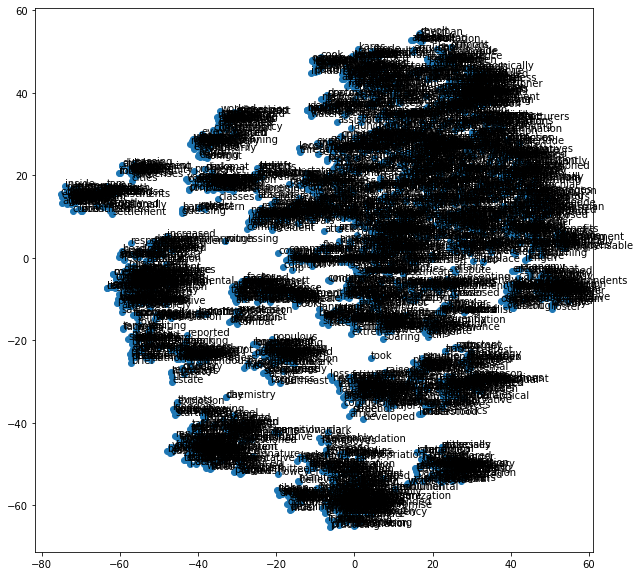

In [18]:
import matplotlib.pyplot as plt

# get 2d embeddings using t-SNE
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
word_embeddings_2d = tsne.fit_transform(word_embeddings)

# plot the embeddings
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(word_embeddings_2d[:, 0], word_embeddings_2d[:, 1])

# annotate the points with the words
for i, word in enumerate(vocab):
    ax.annotate(word, (word_embeddings_2d[i, 0], word_embeddings_2d[i, 1]))

plt.show()


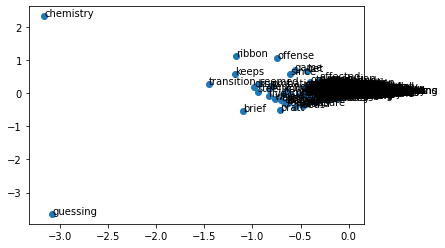

In [19]:
# apply SVD to reduce the dimensionality of the embeddings to 2
U, S, Vt = np.linalg.svd(word_embeddings)
reduced_embeddings = np.dot(word_embeddings, Vt[:2].T)

# plot the reduced embeddings
fig, ax = plt.subplots()
ax.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1])

# annotate each point with its corresponding word
for i, word in enumerate(vocab):
    ax.annotate(word, (reduced_embeddings[i, 0], reduced_embeddings[i, 1]))

plt.show()


### 3. Investigation part (d)

In [20]:
import numpy as np

# define the analogy
a = "jury"
b = "topics"
c = "county"

# calculate vector differences
vec_a = word_embeddings[word2id[a]]
vec_b = word_embeddings[word2id[b]]
vec_c = word_embeddings[word2id[c]]
diff1 = vec_a - vec_b
diff2 = vec_c - diff1

# find closest word in vocabulary
distances = np.linalg.norm(word_embeddings - diff2, axis=1)
closest_word_index = np.argmin(distances)
closest_word = id2word[closest_word_index]

# print the answer
print(f"grant {a} commented number {b} among {closest_word} fulton {c}")

grant jury commented number topics among district fulton county
